# Co-BioNet Demo

This notebook shows how to generate and visualize predictions for unseen patient data using Co-BioNet trained models.

Expected run time : 15 minutes

In [12]:
# Import necessary Libraries
import warnings
warnings.filterwarnings('ignore')

import torch
import os
import sys

In [13]:
# Import python files
sys.path
sys.path.append('../code')
from networks.net_factory import net_factory
from utils.test_patch_best import test_all_case

## Co-BioNet Models

If you want to visualize predictions of Pancreas CT dataset, define dataset_name = "Pancreas_CT", else dataset_name = "LA".

Make sure to add correct labelnum parameter.

|  | Pancreas CT | Left Atrial MRI |
| :- | -: | :-: |
| 10 % Labeled Model | labelnum = 6 | labelnum = 8
| 20 % Labeled Model | labelnum = 12 | labelnum = 16

In [14]:
# Give dataset details and other parameters
dataset_name = "Pancreas_CT"
exp = "Co_BioNet"
labelnum = 6
model = "vnet"
test_save_path = f"./predictions_{dataset_name}/"
num_classes = 2
detail = 1
nms = 1
os.environ['CUDA_VISIBLE_DEVICES'] = "0"

In [15]:
# Give trained model details
snapshot_path ="../code/model/{}_{}_{}_labeled/{}".format(dataset_name, exp, labelnum, model)

In [16]:
num_classes = 2
if dataset_name == "LA":
    patch_size = (112, 112, 80)
    root_path = '../data/LA'
    with open(root_path + '/sample_test.list', 'r') as f:
        image_list = f.readlines()
    image_list = [root_path + "/2018LA_Seg_Training Set/" + item.replace('\n', '') + "/mri_norm2.h5" for item in
                  image_list]

elif dataset_name == "Pancreas_CT":
    patch_size = (96, 96, 96)
    root_path = '../data/Pancreas'
    with open(root_path + '/sample_test.list', 'r') as f:
        image_list = f.readlines()
    image_list = [root_path + "/Pancreas_h5/" + item.replace('\n', '') + "_norm.h5" for item in image_list]

if not os.path.exists(test_save_path):
    os.makedirs(test_save_path)
print(test_save_path)

./predictions_Pancreas_CT/


In [17]:
def calculate_metric():
    net_1 = net_factory(net_type='vnet', in_chns=1, class_num=num_classes - 1, mode="test")
    save_mode_path_1 = os.path.join(snapshot_path, 'best_model_1.pth'.format(model))
    net_1.load_state_dict(torch.load(save_mode_path_1), strict=False)
    print("init weight from {}".format(save_mode_path_1))
    net_1.eval()

    net_2 = net_factory(net_type='vnet', in_chns=1, class_num=num_classes - 1, mode="test")
    save_mode_path_2 = os.path.join(snapshot_path, 'best_model_2.pth'.format(model))
    net_2.load_state_dict(torch.load(save_mode_path_2), strict=False)
    print("init weight from {}".format(save_mode_path_2))
    net_2.eval()

    if dataset_name == "LA":
        avg_metric = test_all_case(model, 1, net_1, net_2, image_list, num_classes=num_classes,
                                   patch_size=(112, 112, 80), stride_xy=18, stride_z=4,
                                   save_result=True, test_save_path=test_save_path,
                                   metric_detail=detail, nms=nms)
    elif dataset_name == "Pancreas_CT":
        avg_metric = test_all_case(model, 1, net_1, net_2, image_list, num_classes=num_classes,
                                   patch_size=(96, 96, 96), stride_xy=16, stride_z=16,
                                   save_result=True, test_save_path=test_save_path,
                                   metric_detail=detail, nms=nms)

    return avg_metric

## Generate Predictions for sample of test data

This generates predictions and scores. 

**DICE SIMILARITY COEFFICIENT, JACCARD INDEX, HAUSDORFF DISTANCE** & **AVERAGE SURFACE DISTANCE** respectively

In [18]:
metric = calculate_metric()
print(metric)

init weight from ../code/model/Pancreas_CT_Co_BioNet_6_labeled/vnet\best_model_1.pth
init weight from ../code/model/Pancreas_CT_Co_BioNet_6_labeled/vnet\best_model_2.pth
00,	0.80531, 0.67408, 5.00000, 1.70518
01,	0.73009, 0.57491, 9.48683, 2.25029
average metric is decoder 1 [0.76769875 0.62449313 7.24341649 1.97773557]
[0.76769875 0.62449313 7.24341649 1.97773557]


## Visualization of Predictions

To visualize predictions we convert generated nifty into gifs.

For that we use gif_your_nifty open source library.

Reference : 

https://github.com/miykael/gif_your_nifti

https://www.kaggle.com/code/yassinealouini/gif-brain/notebook

In [19]:
!git clone https://github.com/miykael/gif_your_nifti
!pip install -r gif_your_nifti/requirements.txt

# Need to add the library to Python path
import sys
sys.path.insert(0, "gif_your_nifti")

!python gif_your_nifti/setup.py install

fatal: destination path 'gif_your_nifti' already exists and is not an empty directory.


running install
running bdist_egg
running egg_info
writing gif_your_nifti.egg-info\PKG-INFO
writing dependency_links to gif_your_nifti.egg-info\dependency_links.txt
writing entry points to gif_your_nifti.egg-info\entry_points.txt
writing requirements to gif_your_nifti.egg-info\requires.txt
writing top-level names to gif_your_nifti.egg-info\top_level.txt
reading manifest file 'gif_your_nifti.egg-info\SOURCES.txt'
writing manifest file 'gif_your_nifti.egg-info\SOURCES.txt'
installing library code to build\bdist.win-amd64\egg
running install_lib
running build_py
creating build\bdist.win-amd64\egg
creating build\bdist.win-amd64\egg\gif_your_nifti
copying build\lib\gif_your_nifti\setup.py -> build\bdist.win-amd64\egg\gif_your_nifti
byte-compiling build\bdist.win-amd64\egg\gif_your_nifti\setup.py to setup.cpython-38.pyc
creating build\bdist.win-amd64\egg\EGG-INFO
copying gif_your_nifti.egg-info\PKG-INFO -> build\bdist.win-amd64\egg\EGG-INFO
copying gif_your_nifti.egg-info\SOURCES.txt -> buil

C:\Users\himas\anaconda3\lib\site-packages\setuptools\command\install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
C:\Users\himas\anaconda3\lib\site-packages\setuptools\command\easy_install.py:144: EasyInstallDeprecationWarning: easy_install command is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
C:\Users\himas\anaconda3\lib\site-packages\pkg_resources\__init__.py:123: PkgResourcesDeprecationWarning: 4.0.0-unsupported is an invalid version and will not be supported in a future release
  warnings.warn(
error: [WinError 32] The process cannot access the file because it is being used by another process: 'c:\\users\\himas\\anaconda3\\lib\\site-packages\\gif_your_nifti-0.2.0-py3.8.egg'


In [20]:
# Not the cleanest import but it works :p
from gif_your_nifti.core import write_gif_pseudocolor
size = 1
fps = 20
cmap = 'hot'

write_gif_pseudocolor(f"{test_save_path}00_img.nii.gz", size, fps, cmap)
write_gif_pseudocolor(f"{test_save_path}00_pred.nii.gz", size, fps, cmap)
write_gif_pseudocolor(f"{test_save_path}00_gt.nii.gz", size, fps, cmap)

write_gif_pseudocolor(f"{test_save_path}01_img.nii.gz", size, fps, cmap)
write_gif_pseudocolor(f"{test_save_path}01_pred.nii.gz", size, fps, cmap)
write_gif_pseudocolor(f"{test_save_path}01_gt.nii.gz", size, fps, cmap)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Original Scan


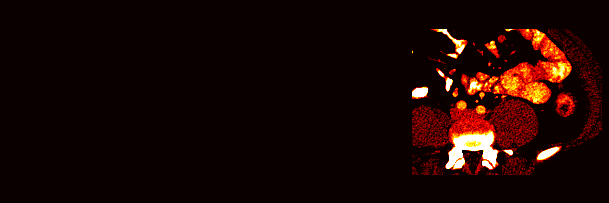

Ground Truth Annotation By an Expert


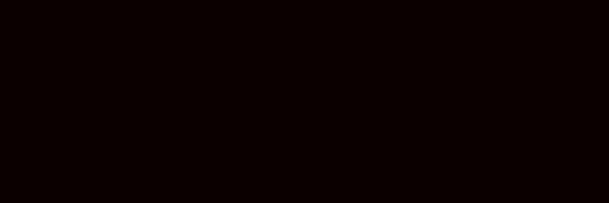

Segmentation Mask generated by Co-BioNet


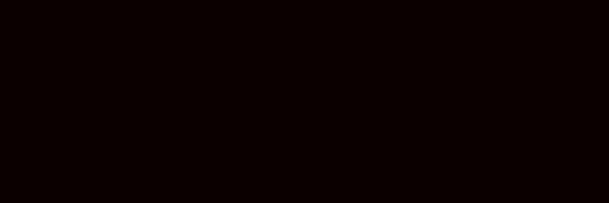

In [21]:
from IPython.display import Image

files = [f"{test_save_path}00_img_hot.gif", f"{test_save_path}00_gt_hot.gif", f"{test_save_path}00_pred_hot.gif"]
captions = ["Original Scan", "Ground Truth Annotation By an Expert", "Segmentation Mask generated by Co-BioNet"]
i = 0
for file in files:
    print(captions[i])
    display(Image(file, width=320, height=240))
    i = i+1

## 3D Visualization

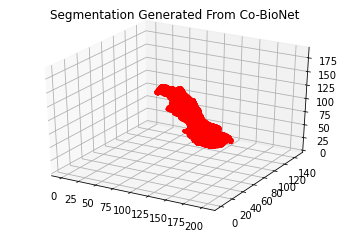

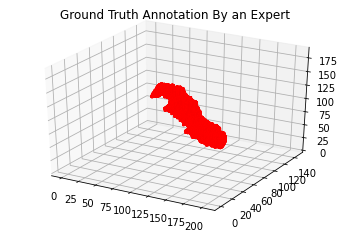

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import SimpleITK as sitk

pred_path = f"{test_save_path}00_pred.nii.gz"
pred_seg_img = sitk.ReadImage(pred_path)
prediction_00 = sitk.GetArrayFromImage(pred_seg_img)

pred_class1 = prediction_00 == 1

gt_path = f"{test_save_path}00_gt.nii.gz"
gt_seg_img = sitk.ReadImage(gt_path)
gt_00 = sitk.GetArrayFromImage(gt_seg_img)

gt_class1 = gt_00 == 1

voxelarray1 = pred_class1 
voxelarray2 = gt_class1 

colors1 = np.empty(voxelarray1.shape, dtype=object)
colors1[pred_class1] = 'red'
colors2 = np.empty(voxelarray2.shape, dtype=object)
colors2[gt_class1] = 'red'

ax1 = plt.figure().add_subplot(projection='3d')
ax1.voxels(voxelarray1, facecolors=colors1, edgecolor='r')
ax1.set_title("Segmentation Generated From Co-BioNet")

ax2 = plt.figure().add_subplot(projection='3d')
ax2.voxels(voxelarray2, facecolors=colors2, edgecolor='r')
ax2.set_title("Ground Truth Annotation By an Expert")

plt.show()